# import data

In [1]:
import sqlite3
conn = sqlite3.connect('pmcv1-full.db')
c = conn.cursor()

** available tables **
- **refs**: _pmid_ integer, _refpmid_ integer
- **pmcidmap**: _pmid_ integer, _pmcid_ integer
- **meta**: _pmid_ integer, title text, journal_id text
- **authors**: _pmid_ integer, _authnum_ integer, _fn_ text, _ln_ text
- **keywords**: _pmid_ integer, _keyword_ text
- **abstracts**: _pmid_ integer, _abstract_ text

**SQL tables:**
<img src="sqltables.png">

# generate full graph and plot in and out degree

In [2]:
import graph_tool as gt

In [2]:
import cPickle as pickle

In [3]:
g = pickle.load(open("full_graph.p", "rb"))
pmid_vertex_dict = pickle.load(open("full_graph_pmid_vertex_dict.p", "rb"))

In [4]:
#plots
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

(array([  7.55125200e+06,   1.43924000e+05,   3.12780000e+04,
          1.15570000e+04,   5.62600000e+03,   3.09700000e+03,
          1.96600000e+03,   1.29700000e+03,   8.93000000e+02,
          6.29000000e+02,   4.42000000e+02,   3.96000000e+02,
          2.73000000e+02,   2.54000000e+02,   1.74000000e+02,
          1.53000000e+02,   1.43000000e+02,   1.01000000e+02,
          7.70000000e+01,   8.10000000e+01,   6.30000000e+01,
          6.40000000e+01,   4.90000000e+01,   4.50000000e+01,
          3.80000000e+01,   3.80000000e+01,   3.10000000e+01,
          2.90000000e+01,   2.80000000e+01,   1.70000000e+01,
          2.20000000e+01,   1.50000000e+01,   1.40000000e+01,
          1.20000000e+01,   1.90000000e+01,   2.10000000e+01,
          1.00000000e+01,   1.10000000e+01,   1.20000000e+01,
          7.00000000e+00,   1.00000000e+01,   8.00000000e+00,
          8.00000000e+00,   9.00000000e+00,   1.10000000e+01,
          1.10000000e+01,   7.00000000e+00,   5.00000000e+00,
        

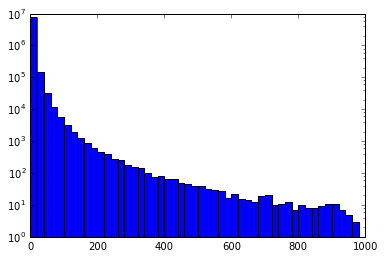

In [5]:
#plot in degree
indegree = []
for vertex in g.vertices():
    indegree.append(vertex.in_degree())
plt.hist(indegree, np.arange(0,1000,20), log = True)

(array([  1.37930000e+05,   1.81997000e+05,   1.88491000e+05,
          1.52772000e+05,   1.05358000e+05,   6.18250000e+04,
          3.43840000e+04,   1.93530000e+04,   1.21570000e+04,
          8.02800000e+03,   5.55600000e+03,   4.07300000e+03,
          3.14300000e+03,   2.49200000e+03,   1.94900000e+03,
          1.54000000e+03,   1.18800000e+03,   9.34000000e+02,
          7.56000000e+02,   6.90000000e+02,   5.19000000e+02,
          3.97000000e+02,   3.38000000e+02,   2.68000000e+02,
          2.10000000e+02,   1.96000000e+02,   1.37000000e+02,
          1.32000000e+02,   8.90000000e+01,   8.60000000e+01,
          7.80000000e+01,   6.00000000e+01,   5.70000000e+01,
          3.30000000e+01,   3.70000000e+01,   4.20000000e+01,
          2.90000000e+01,   2.20000000e+01,   1.90000000e+01,
          2.00000000e+01,   9.00000000e+00,   1.30000000e+01,
          1.30000000e+01,   1.20000000e+01,   8.00000000e+00,
          8.00000000e+00,   6.00000000e+00,   6.00000000e+00,
        

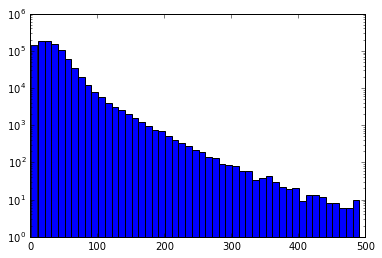

In [6]:
#plot out degree
outdegree = []
for vertex in g.vertices():
    outdegree.append(vertex.out_degree())
plt.hist(outdegree, np.arange(1,500,10), log = True)

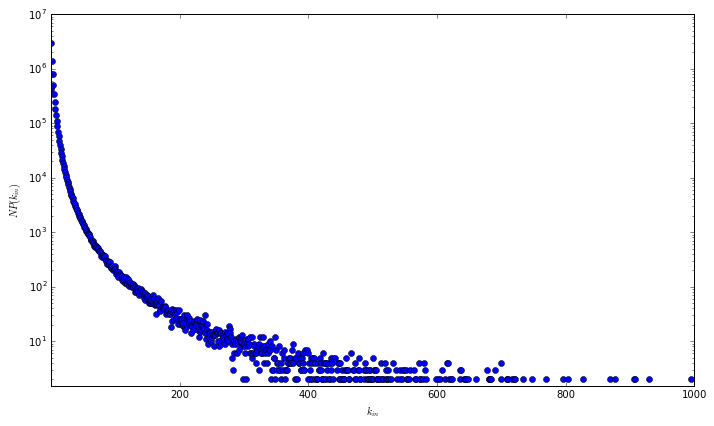

In [6]:
# Let's plot its in-degree distribution
import graph_tool.stats as gtstats
in_hist = gtstats.vertex_hist(g, "in")

y = in_hist[0]
plt.figure(figsize=(10,6))
plt.errorbar(in_hist[1][:-1], in_hist[0], fmt="o", label="in")
plt.gca().set_yscale("log")
plt.gca().set_xlim(1, 1e3)
plt.gca().set_ylim(1.5,)
plt.xlabel("$k_{in}$")
plt.ylabel("$NP(k_{in})$")
plt.tight_layout()

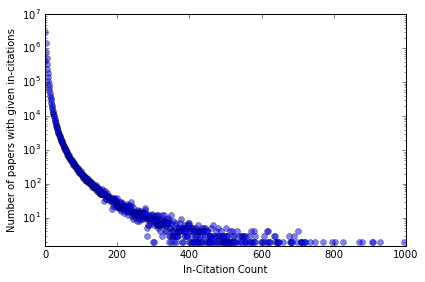

In [15]:
#to save for web
# Let's plot its in-degree distribution
import graph_tool.stats as gtstats
in_hist = gtstats.vertex_hist(g, "in")

y = in_hist[0]
plt.figure(figsize=(6,4))
plt.errorbar(in_hist[1][:-1], in_hist[0], fmt="o", label="in", alpha=0.5)
plt.gca().set_yscale("log")
plt.gca().set_xlim(1, 1e3)
plt.gca().set_ylim(1.5,)
plt.xlabel("In-Citation Count")
plt.ylabel("Number of papers with given in-citations")
plt.tight_layout()
plt.savefig('incites.svg')

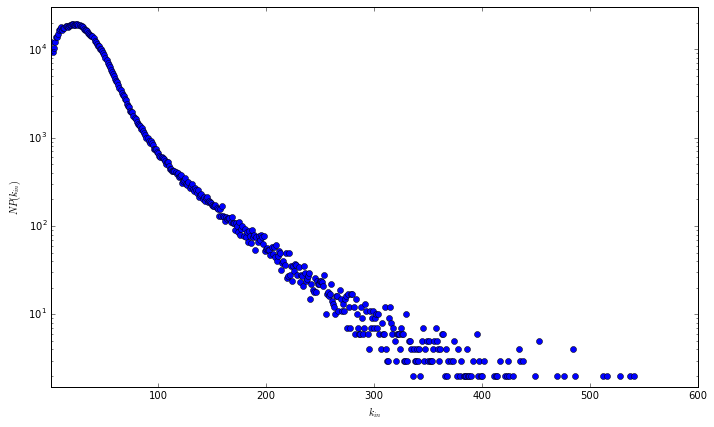

In [7]:
# Let's plot its in-degree distribution
import graph_tool.stats as gtstats
in_hist = gtstats.vertex_hist(g, "out")

y = in_hist[0]
plt.figure(figsize=(10,6))
plt.errorbar(in_hist[1][:-1], in_hist[0], fmt="o", label="out")
plt.gca().set_yscale("log")
plt.gca().set_xlim(1, 600)
plt.gca().set_ylim(1.5,3e4)
plt.xlabel("$k_{in}$")
plt.ylabel("$NP(k_{in})$")
plt.tight_layout()

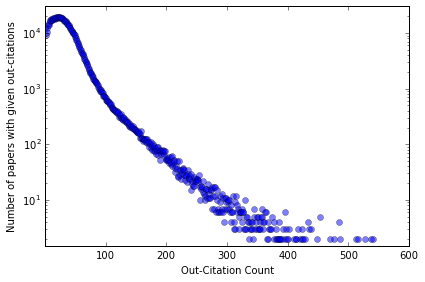

In [17]:
#to save for web
# Let's plot its in-degree distribution
import graph_tool.stats as gtstats
in_hist = gtstats.vertex_hist(g, "out")

y = in_hist[0]
plt.figure(figsize=(6,4))
plt.errorbar(in_hist[1][:-1], in_hist[0], fmt="o", label="out", alpha = 0.5)
plt.gca().set_yscale("log")
plt.gca().set_xlim(1, 600)
plt.gca().set_ylim(1.5,3e4)
plt.xlabel("Out-Citation Count")
plt.ylabel("Number of papers with given out-citations")
plt.tight_layout()
plt.savefig('outcites.svg')

In [28]:
g

<Graph object, directed, with 7754378 vertices and 31231542 edges at 0x1154381d0>

# Generate small graph for only a PMID's neighbors to a depth of two in both directions
## initially, because it's much easier, only look at outgoing neighbors

In [59]:
rootpmid = 26247944
c.execute('''SELECT refpmid FROM refs WHERE pmid = ?''', [rootpmid])
output = c.fetchall()
print output

[(19464502,), (16130266,), (23897068,), (11719411,), (18241089,), (10739516,), (20502295,), (22441437,), (22495898,), (23362106,), (20664402,), (20166149,), (21386680,), (21520318,), (19777530,), (21257082,), (16374755,), (21439542,), (18817592,), (24150027,), (19516271,), (21474517,), (21185077,), (18991324,), (17322170,), (17071607,), (17368534,), (8405630,), (11844193,), (12420836,), (17899573,), (20232288,), (17149788,), (18332385,), (22753319,), (22846473,), (25136369,), (21115197,), (21295850,), (21254145,), (18480117,), (18259003,), (24752037,), (21389681,), (21210481,), (19656558,), (24970282,), (13680354,), (25653039,), (24959436,), (14764923,), (12618519,), (11943725,), (24166749,), (23331974,), (22906914,), (24444293,), (17553534,), (16957146,), (10077652,), (19215554,), (14678084,), (12648442,), (11932314,), (10875882,), (18771979,), (18655226,), (21252475,), (15280143,), (14710054,), (19497882,), (22036528,), (18259009,), (18753763,), (19035985,), (17618748,), (24607918,),

In [51]:
for pmid in output:
    c.execute('''SELECT refpmid FROM refs WHERE pmid = ?''', [pmid[0]])
    print c.fetchall()

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[(15733721,), (15947178,), (15743856,), (18259010,), (19541696,), (9725924,), (18480117,), (18259003,), (12796047,), (19087081,), (19369368,), (14662228,), (15760998,), (15924523,), (19516271,), (17443552,), (20687064,), (6668417,), (15094256,), (1393159,), (15856728,), (19155903,), (10925900,), (15387864,), (19477892,), (19336487,), (19502216,), (17556761,), (12193937,), (9396883,), (16098866,), (18475158,), (18725583,), (17903233,), (16169871,), (16157095,), (16678332,), (17975258,), (14520224,), (15042008,), (10521771,), (18819756,), (19586138,), (19273739,), (19813221,)]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[(19464502,), (18241089,), (11719411,), (12908998,), (20664402,), (22441437,), (22495898,), (22846473,), (22906914,), (24150027,), (19516271,), (6054057,), (3790464,), (1946241,), (11566964,), (12420836,), (11844193,), (17899573,), (16579806,), (22248988,), (15611362,), (9607693,), (10673728,), (15957992,), (736

In [60]:
def addedge(graphobject, source, dest, vertexdict):
    if source not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[source] = int(v)
    if dest not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[dest] = int(v)
    graphobject.add_edge(vertexdict[source], vertexdict[dest])
    return graphobject, vertexdict

In [65]:
minigraph = gt.Graph()
rootpmid = 26247944
c.execute('''SELECT refpmid FROM refs WHERE pmid = ?''', [rootpmid])
children = c.fetchall()
vertexdict = dict()
for child in children:
    minigraph, vertexdict = addedge(minigraph, rootpmid, child[0], vertexdict)
    c.execute('''SELECT refpmid FROM refs WHERE pmid = ?''', [child[0]])
    secondchildren = c.fetchall()
    for child2 in secondchildren:
        minigraph, vertexdict = addedge(minigraph, child[0], child2[0], vertexdict)

In [78]:
minigraph

<Graph object, directed, with 438 vertices and 531 edges at 0x116daa7d0>

In [212]:
import graph_tool.all as gt
import math

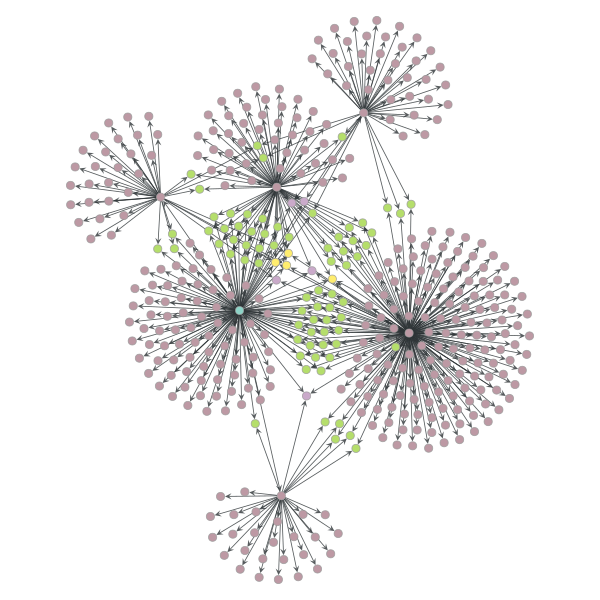

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x116daa7d0, at 0x116804090>

In [213]:
deg = minigraph.degree_property_map("in")
#deg.a = 4 * (math.sqrt(deg.a) * 0.5 + 0.4)
gt.graph_draw(minigraph, vertex_fill_color=deg)

In [ ]:
# CO-AUTHORSHIP NETWORK???
# https://graph-tool.skewed.de/static/doc/draw.html

## rewrite above without slow sql commands using graph network

In [150]:
rev_pmid_vertex_dict = {v: k for k, v in pmid_vertex_dict.items()}

In [202]:
def addedge(graphobject, source, dest, vertexdict):
    if source not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[source] = int(v)
    if dest not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[dest] = int(v)
    graphobject.add_edge(vertexdict[source], vertexdict[dest])
    return graphobject, vertexdict

In [258]:
rootpmid = 26247944
minigraph2 = gt.Graph()
vertexdict2 = dict()
for neigh in g.vertex(pmid_vertex_dict[rootpmid]).out_neighbours(): 
    minigraph2, vertexdict2 = addedge(minigraph2, rootpmid, neigh, vertexdict2)
    try:
        for neigh2 in g.vertex(neigh).out_neighbours():
            minigraph2, vertexdict2 = addedge(minigraph2, neigh, neigh2, vertexdict2)
    except KeyError:
        print "{} not in graph g".format(neigh)

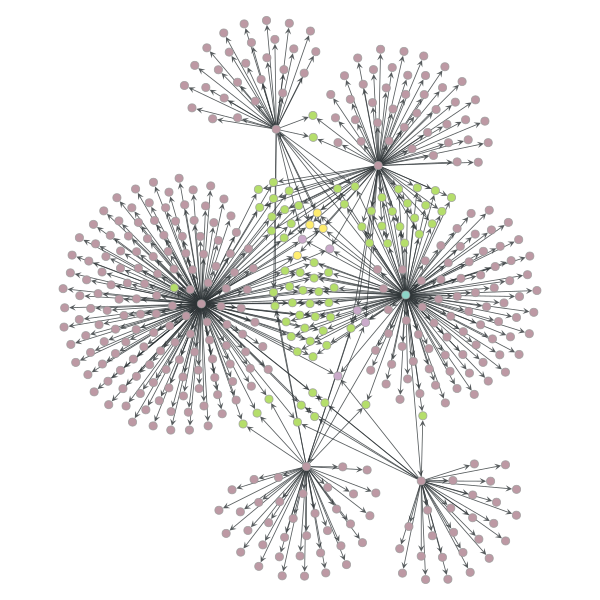

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x116ada850, at 0x117640950>

In [259]:
deg = minigraph2.degree_property_map("in")
gt.graph_draw(minigraph2, vertex_fill_color=deg)

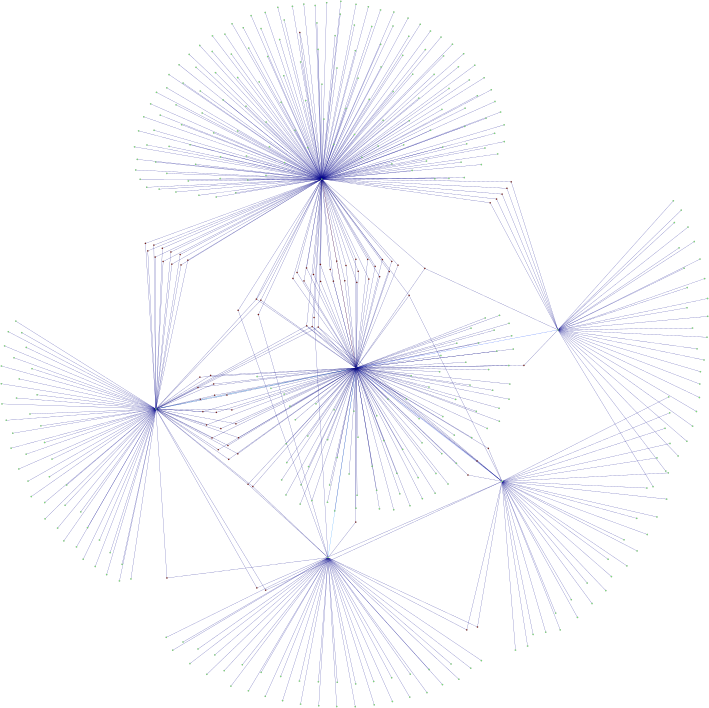

In [273]:
deg = minigraph2.degree_property_map("in")
deg.a = 2 * (np.sqrt(deg.a) * 0.5 + 0.4)
ebet = gt.betweenness(minigraph2)[1]
### for inline support
from IPython.display import SVG, display
###
gt.graphviz_draw(minigraph2, vcolor=deg, vorder=deg, elen=10, ecolor=ebet, 
                 eorder=ebet, output = "/tmp/3961631087.svg", output_format="svg",
                size = (25,25))
display(SVG(filename = "/tmp/3961631087.svg"))

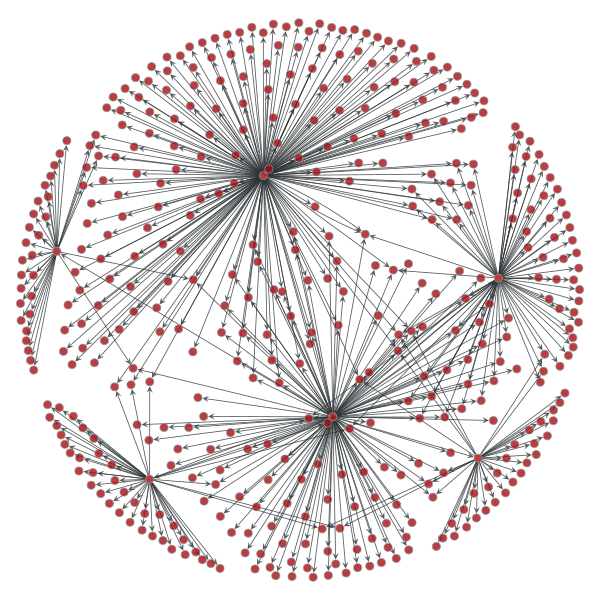

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x1167a76d0, at 0x1185fc590>

In [214]:
pos = draw.arf_layout(minigraph2)
gt.graph_draw(minigraph2, pos=pos)

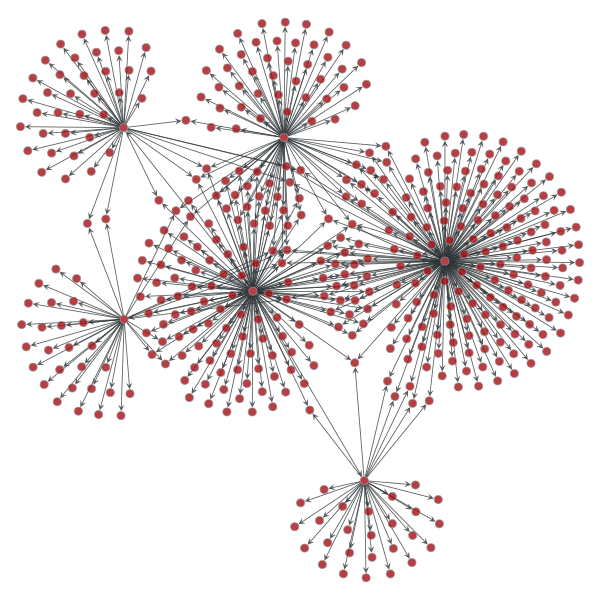

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x1167a76d0, at 0x1185fca90>

In [215]:
pos = draw.sfdp_layout(minigraph2, cooling_step=0.95)
gt.graph_draw(minigraph2, pos=pos)

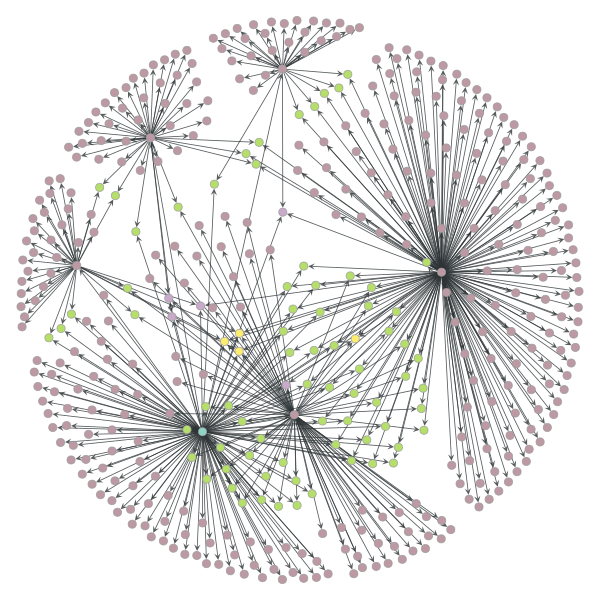

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x117703d50, at 0x116aae450>

In [196]:
pos = draw.arf_layout(minigraph2)
deg = minigraph2.degree_property_map("in")
gt.graph_draw(minigraph2, pos=pos, vertex_fill_color=deg)

/usr/local/lib/python2.7/site-packages/graph_tool/draw/cairo_draw.py:619: UserWarning: Unknown parameter: layout_callback
  warnings.warn("Unknown parameter: " + k, UserWarning)
/usr/local/lib/python2.7/site-packages/graph_tool/draw/cairo_draw.py:619: UserWarning: Unknown parameter: key_press_callback
  warnings.warn("Unknown parameter: " + k, UserWarning)


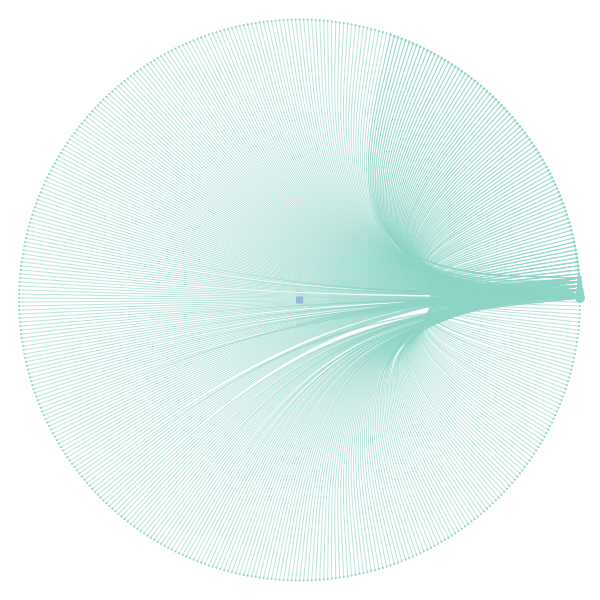

(<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x1167a76d0, at 0x117640190>,
 <Graph object, directed, with 439 vertices and 438 edges at 0x117654e10>,
 <PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x117654e10, at 0x117648050>)

In [219]:
state = gt.minimize_nested_blockmodel_dl(minigraph2, deg_corr=True)
gt.draw_hierarchy(state)

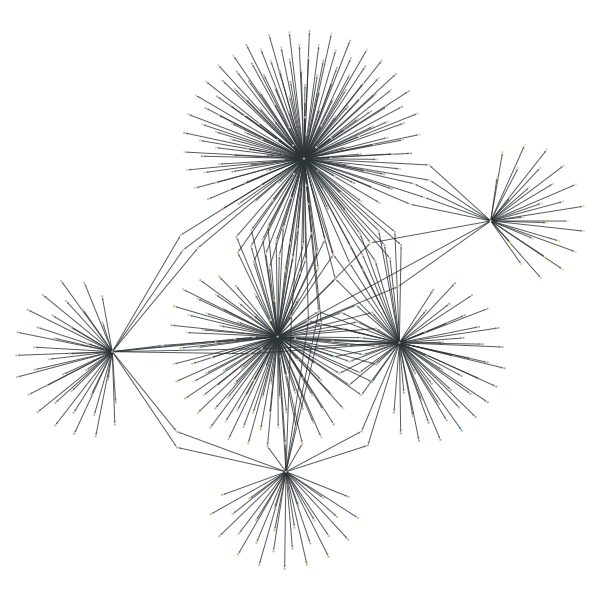

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x1167a76d0, at 0x1185fce50>

In [217]:
gt.graph_draw(minigraph2, pos=draw.sfdp_layout(minigraph2, cooling_step=0.99),
              vertex_fill_color=minigraph2.vertex_index, vertex_size=2,
              edge_pen_width=1)

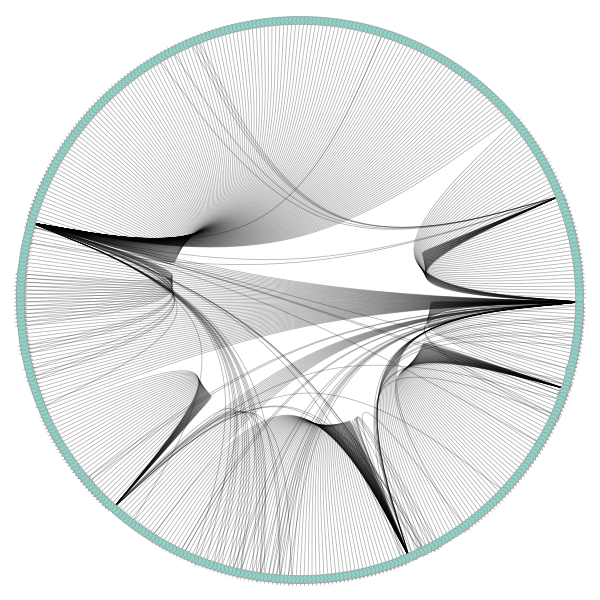

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x1167a76d0, at 0x11770ce50>

In [238]:
# LOOK INTO CO-AUTHORSHIP NETWORKS
# https://graph-tool.skewed.de/static/doc/draw.html
# http://www.ncbi.nlm.nih.gov/pmc/articles/PMC2721762/
g = minigraph2
g.purge_vertices()
state = gt.minimize_nested_blockmodel_dl(g, deg_corr=True)
t = gt.get_hierarchy_tree(state)[0]
tpos = pos = gt.radial_tree_layout(t, t.vertex(t.num_vertices() - 1), weighted=True)
cts = gt.get_hierarchy_control_points(g, t, tpos)
pos = g.own_property(tpos)
b = state.levels[0].b
shape = b.copy()
shape.a %= 14
gt.graph_draw(g, pos=pos, vertex_fill_color=b, vertex_shape=shape, edge_control_points=cts,
              edge_color=[0, 0, 0, 0.3], vertex_anchor=0)

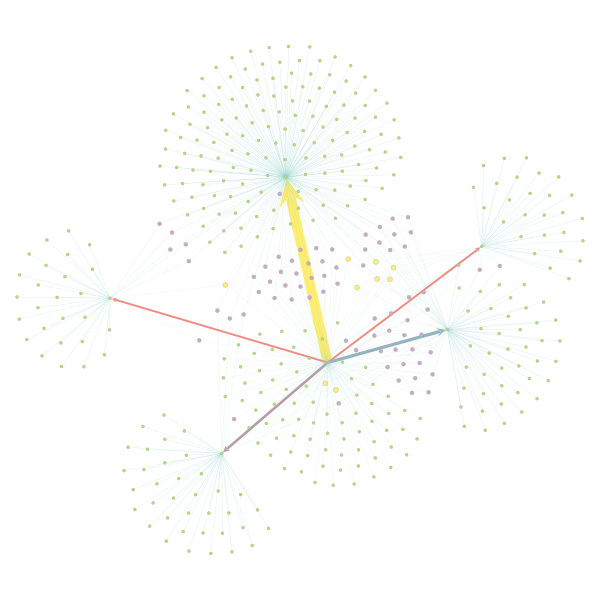

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x1167a76d0, at 0x116adaa10>

In [242]:
deg = minigraph2.degree_property_map("in")
deg.a = 4 * (np.sqrt(deg.a) * 0.5 + 0.4)
ebet = gt.betweenness(minigraph2)[1]
ebet.a /= ebet.a.max() / 10.
eorder = ebet.copy()
eorder.a *= -1
pos = gt.sfdp_layout(minigraph2)
control = g.new_edge_property("vector<double>")
for e in g.edges():
    d = np.sqrt(sum((pos[e.source()].a - pos[e.target()].a) ** 2)) / 5
    control[e] = [0.3, d, 0.7, d]
gt.graph_draw(minigraph2, pos=pos, vertex_size=deg, vertex_fill_color=deg, vorder=deg,
              edge_color=ebet, eorder=eorder, edge_pen_width=ebet,
              edge_control_points=control)
# SFDP force-directed layout of a Price network with 1500 nodes. The vertex size and color indicate the degree, 
# and the edge color and width the edge betweenness centrality.
# https://graph-tool.skewed.de/static/doc/draw.html

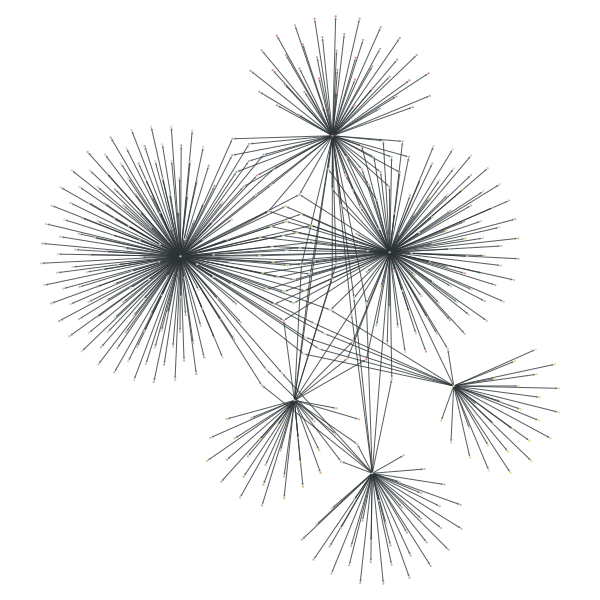

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x1167a76d0, at 0x1185fce90>

In [218]:
gt.graph_draw(minigraph2, pos=draw.sfdp_layout(minigraph2, cooling_step=0.99),
              vertex_fill_color=minigraph2.vertex_index, vertex_size=2,
              edge_pen_width=1)

will make sense to trim down dataset to papers that have interesting citation networks within PMC, since many papers do not! This is a reasonable excuse for this, will also shrink data to make it more managable for dynamic plotting on the webserver. Can I make a statement about liklihood of being in PMC open access by field? Keyword?

Rather than using graph network for dynamic portion of website, to save resources, I can precompute in-neighbors and out-neighbors and save into a sql table and just call these. Alo, in terms of excluding papers that aren't interesting (not in PMC) - rather than doing this, perhaps just don't have them autocomplete in the search window and/or de-rank them in results? Could also color them differently in the graph networks (e.g. red) to indicate that the network terminates there, without specifying why (not in PMC vs too new)?

## to 3 degrees

In [245]:
rootpmid = 26247944
minigraph2 = gt.Graph()
vertexdict2 = dict()
for neigh in g.vertex(pmid_vertex_dict[rootpmid]).out_neighbours(): 
    minigraph2, vertexdict2 = addedge(minigraph2, rootpmid, neigh, vertexdict2)
    try:
        for neigh2 in g.vertex(neigh).out_neighbours():
            minigraph2, vertexdict2 = addedge(minigraph2, neigh, neigh2, vertexdict2)
            try:
                for neigh3 in g.vertex(neigh2).out_neighbours():
                    minigraph2, vertexdict2 = addedge(minigraph2, neigh2, neigh3, vertexdict2)
            except KeyError:
                    print "3rd degree node {} not in graph g".format(neigh)
    except KeyError:
        print "2nd degree node {} not in graph g".format(neigh)

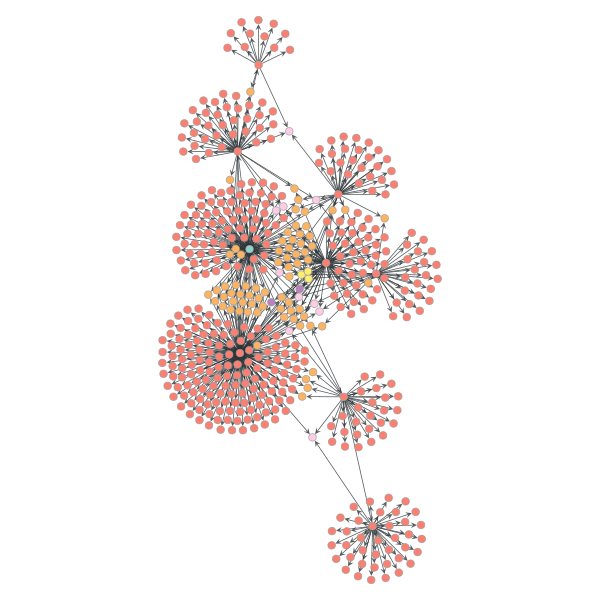

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x116ada450, at 0x1167a7210>

In [247]:
deg = minigraph2.degree_property_map("in")
gt.graph_draw(minigraph2, vertex_fill_color=deg)

## to n degrees

In [402]:
def addedge(graphobject, source, dest, vertexdict):
    if source not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[source] = int(v)
    if dest not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[dest] = int(v)
    graphobject.add_edge(vertexdict[source], vertexdict[dest])
    return graphobject, vertexdict
       
import Queue
import graph_tool.all as gt
def buildlocalgraph(rootnode, mastergraph, indepth = 0, outdepth = 2):
    _g =gt.Graph()
    _vertexdict = dict()
    q = Queue.Queue()
    q.put((rootnode, 0))
    #first go in out direction
    while not q.empty():
        node = q.get()
        if node[1] <= outdepth:
            try:
                for neigh in _g.vertex(node[0]).out_neighbors():
                    _g, _vertexdict = addedge(_g, node[0], neigh, _vertexdict)
            except KeyError:
                "{} degree node {} not in graph g".format(node[1], node[0])
                
def buildlocalgraph(rootnode, mastergraph, indepth = 0, outdepth = 2):
    _g =gt.Graph()
    _vertexdict = dict()
    q = Queue.Queue()
    #first go in out direction
    q.put((rootnode, 0))
    while not q.empty():
        node = q.get()
        if node[1] < outdepth:
            try:
                for neigh in mastergraph.vertex(node[0]).out_neighbours():
                    _g, _vertexdict = addedge(_g, node[0], neigh, _vertexdict)
                    q.put((neigh, node[1]+1))
            except KeyError:
                "{} degree node {} not in graph g".format(node[1], node[0])
    #now go in in direction
    q.put((rootnode, 0))
    while not q.empty():
        node = q.get()
        if node[1] < indepth:
            try:
                for neigh in mastergraph.vertex(node[0]).in_neighbours():
                    _g, _vertexdict = addedge(_g, neigh, node[0], _vertexdict)
                    q.put((neigh, node[1]+1))
            except KeyError:
                "{} degree node {} not in graph g".format(node[1], node[0])
    return _g, _vertexdict

In [343]:
rootpmid = 26247944
minigraph3, vertexdict3 = buildlocalgraph(pmid_vertex_dict[rootpmid], g, 2, 0)

(5690856, 0)


In [383]:
def countoutneigh(g, node):
    count = 0
    for neigh in g.vertex(node).out_neighbours(): count+= 1
    return count

def countinneigh(g, node):
    count = 0
    for neigh in g.vertex(node).in_neighbours(): count+= 1
    return count

In [384]:
countoutneigh(g, 5690856)

137

In [389]:
for neigh in g.vertex(5690856).out_neighbours():
    if countoutneigh(g, neigh) > 0: print countoutneigh(g, neigh), neigh

45 973846
82 1697637
38 2397896
196 2399401
33 5690874


In [393]:
countinneigh(g, 2399401)

12

In [398]:
for i in range(2399400, 2399402):
    print countinneigh(g, i)

1
12


In [439]:
minigraph3, vertexdict3 = buildlocalgraph(2399401, g, 10, 10)

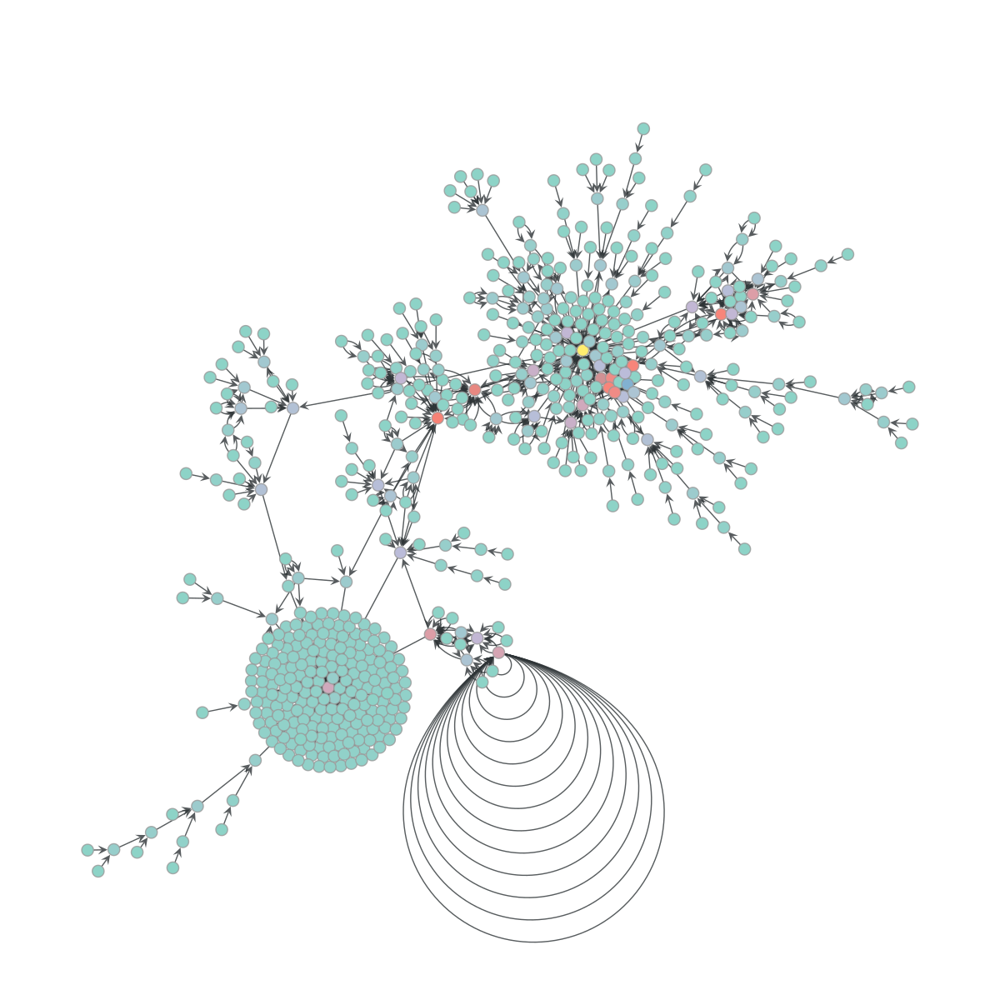

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x117162ad0, at 0x10e7d3590>

In [440]:
deg = minigraph3.degree_property_map("in")
gt.graph_draw(minigraph3, vertex_fill_color=deg, output_size=(1200,1200))

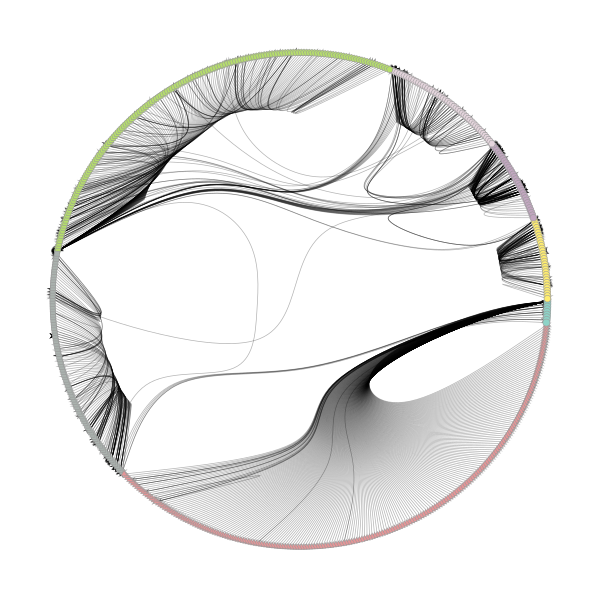

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x1185fcc10, at 0x11765f190>

In [418]:
minigraph3.purge_vertices()
state = gt.minimize_nested_blockmodel_dl(minigraph3, deg_corr=True)
t = gt.get_hierarchy_tree(state)[0]
tpos = pos = gt.radial_tree_layout(t, t.vertex(t.num_vertices() - 1), weighted=True)
cts = gt.get_hierarchy_control_points(minigraph3, t, tpos)
pos = minigraph3.own_property(tpos)
b = state.levels[0].b
shape = b.copy()
shape.a %= 14
gt.graph_draw(minigraph3, pos=pos, vertex_fill_color=b, vertex_shape=shape, edge_control_points=cts,
              edge_color=[0, 0, 0, 0.3], vertex_anchor=0)

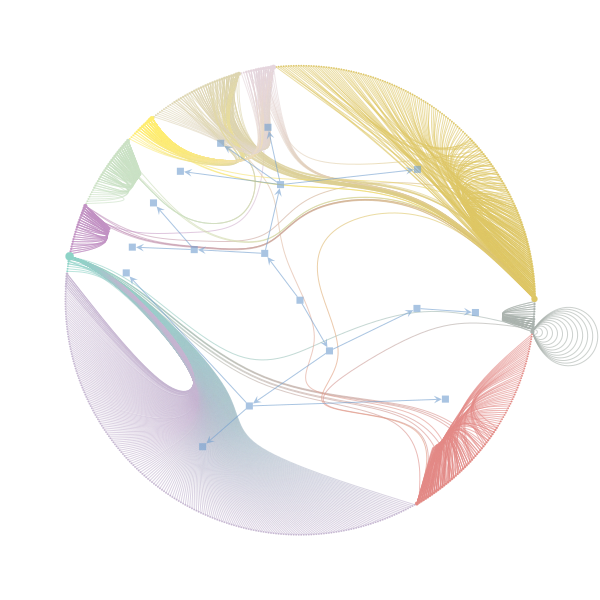

(<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x1172882d0, at 0x1173d0110>,
 <Graph object, directed, with 601 vertices and 600 edges at 0x117288d10>,
 <PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x117288d10, at 0x117288cd0>)

In [421]:
minigraph3, vertexdict3 = buildlocalgraph(2399401, g, 10, 10)
state = gt.minimize_nested_blockmodel_dl(minigraph3, deg_corr=True)
gt.draw_hierarchy(state)

(584, 966)
(152, 273)


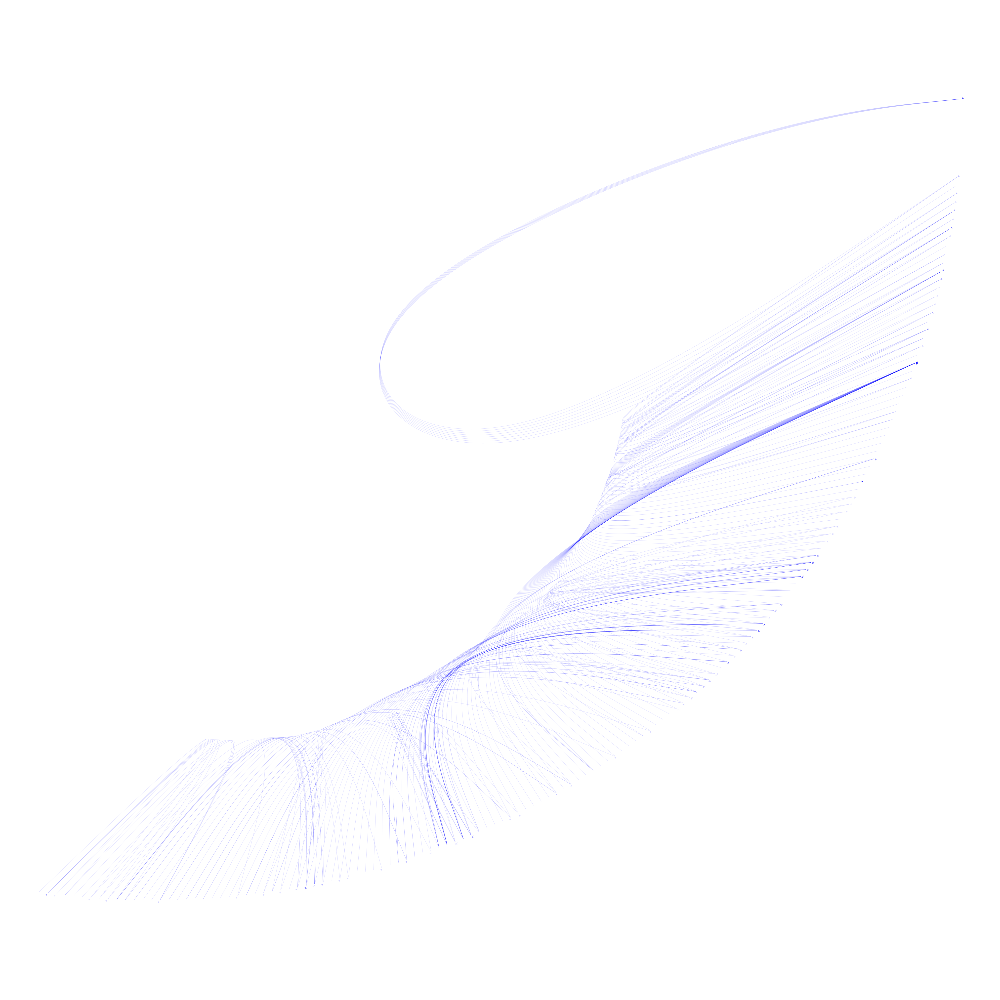

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x11728fc50, at 0x116653090>

In [451]:
import math

g = minigraph3
print(g.num_vertices(), g.num_edges())

#reduce to only connected nodes
g = gt.GraphView(g,vfilt=lambda v: (v.out_degree() > 0) and (v.in_degree() > 0) )
g.purge_vertices()

print(g.num_vertices(), g.num_edges())

#use 1->Republican, 2->Democrat
red_blue_map = {1:(1,0,0,1),0:(0,0,1,1)}
plot_color = g.new_vertex_property('vector<double>')
g.vertex_properties['plot_color'] = plot_color
#for v in g.vertices():
#    plot_color[v] = red_blue_map[g.vertex_properties['value'][v]]  ######### USE THIS FOR GENDER??

#### THIS WAS USED FOR RED/BLUE POLITICAL AFIL
### SEE: http://stackoverflow.com/questions/238724/visualizing-undirected-graph-thats-too-large-for-graphviz

#edge colors
alpha=0.15
edge_color = g.new_edge_property('vector<double>')
g.edge_properties['edge_color']=edge_color
for e in g.edges():
    if plot_color[e.source()] != plot_color[e.target()]:
        if plot_color[e.source()] == (0,0,1,1):
            #orange on dem -> rep
            edge_color[e] = (255.0/255.0, 102/255.0, 0/255.0, alpha)
        else:
            edge_color[e] = (102.0/255.0, 51/255.0, 153/255.0, alpha)            
    #red on rep-rep edges
    elif plot_color[e.source()] == (1,0,0,1):
        edge_color[e] = (1,0,0, alpha)
    #blue on dem-dem edges
    else:
        edge_color[e] = (0,0,1, alpha)

state = gt.minimize_nested_blockmodel_dl(g, deg_corr=True)
bstack = state.get_bstack()
#t = gt.get_hierarchy_tree(bstack)[0]
tpos = pos = gt.radial_tree_layout(t, t.vertex(t.num_vertices() - 1), weighted=True)
cts = gt.get_hierarchy_control_points(g, t, tpos)
pos = g.own_property(tpos)
b = bstack[0].vp["b"]

#labels
text_rot = g.new_vertex_property('double')
g.vertex_properties['text_rot'] = text_rot
for v in g.vertices():
    if pos[v][0] >0:
        text_rot[v] = math.atan(pos[v][1]/pos[v][0])
    else:
        text_rot[v] = math.pi + math.atan(pos[v][1]/pos[v][0])

gt.graph_draw(g, pos=pos, vertex_fill_color=g.vertex_properties['plot_color'], 
            vertex_color=g.vertex_properties['plot_color'],
            edge_control_points=cts,
            vertex_size=10,
            #vertex_text=g.vertex_properties['label'],
            vertex_text_rotation=g.vertex_properties['text_rot'],
            vertex_text_position=1,
            vertex_font_size=9,
            edge_color=g.edge_properties['edge_color'],
            vertex_anchor=0,
            #bg_color=[0,0,0,1],
            output_size=[4024,4024])
            #output='polblogs_blockmodel.png')

## FIND INTERESTING PAPER WITH MANY IN AND OUT CITES

In [452]:
import cPickle as pickle
g = pickle.load(open("full_graph.p", "rb"))
pmid_vertex_dict = pickle.load(open("full_graph_pmid_vertex_dict.p", "rb"))
rev_pmid_vertex_dict = {v: k for k, v in pmid_vertex_dict.items()}

In [461]:
for node in range(5000):
    inn = countinneigh(g,node)
    outn = countoutneigh(g, node)
    if (inn > 30) & (outn > 30): print node, rev_pmid_vertex_dict[node]

48 20502679
54 18803808
195 21042317
259 19783989
332 24304892
597 19874578
734 15933209
939 20804570
999 17211480
1000 16404366
1028 20964822
1042 19582160
1043 21884641
1130 21460848
1184 18349830
1214 22847613
1407 22821563
1514 20601955
1521 15535852
1880 16538219
1951 21917858
2059 18981049
2068 17088286
2218 17493263
2220 16643655
2232 20813035
2669 23700391
2696 23034130
2783 16948836
2798 19934210
3021 19621072
3223 20615901
3229 21423178
3230 19002258
3538 18682804
3705 23000897
3754 21247443
4603 21097890
4811 22006249
4820 16563223
4908 16751849


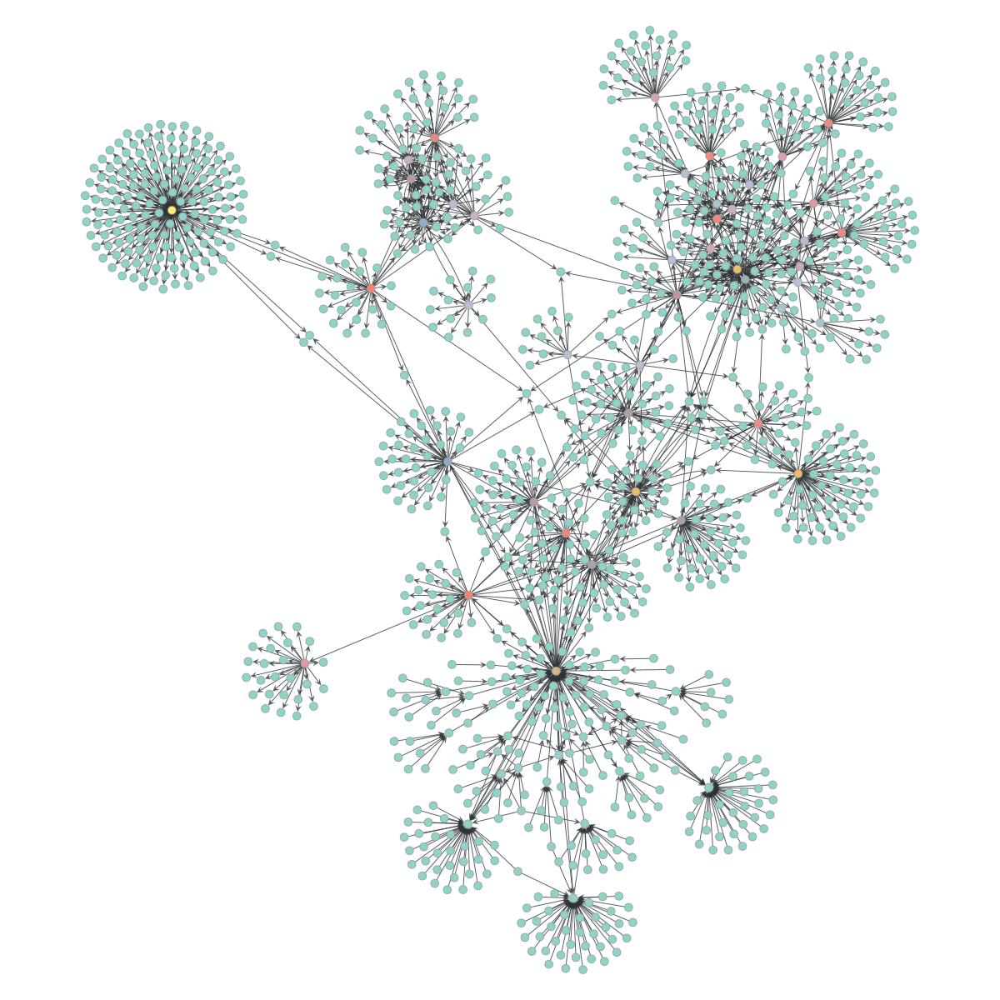

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x116d10410, at 0x116602350>

In [473]:
rootpmid = 20502679
minigraph3, vertexdict3 = buildlocalgraph(pmid_vertex_dict[rootpmid], g, 2, 5)
deg = minigraph3.degree_property_map("out") #out AND in how?
gt.graph_draw(minigraph3, vertex_fill_color=deg, output_size=(1200,1200))

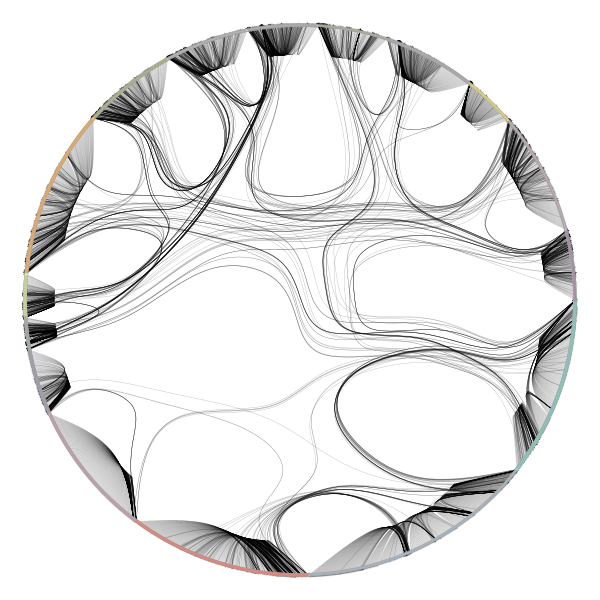

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x117410cd0, at 0x1164cc210>

In [477]:
minigraph3, vertexdict3 = buildlocalgraph(pmid_vertex_dict[rootpmid], g, 5, 5)
minigraph3.purge_vertices()
state = gt.minimize_nested_blockmodel_dl(minigraph3, deg_corr=True)
t = gt.get_hierarchy_tree(state)[0]
tpos = pos = gt.radial_tree_layout(t, t.vertex(t.num_vertices() - 1), weighted=True)
cts = gt.get_hierarchy_control_points(minigraph3, t, tpos)
pos = minigraph3.own_property(tpos)
b = state.levels[0].b
shape = b.copy()
shape.a %= 14
gt.graph_draw(minigraph3, pos=pos, vertex_fill_color=b, vertex_shape=shape, edge_control_points=cts,
              edge_color=[0, 0, 0, 0.3], vertex_anchor=0)

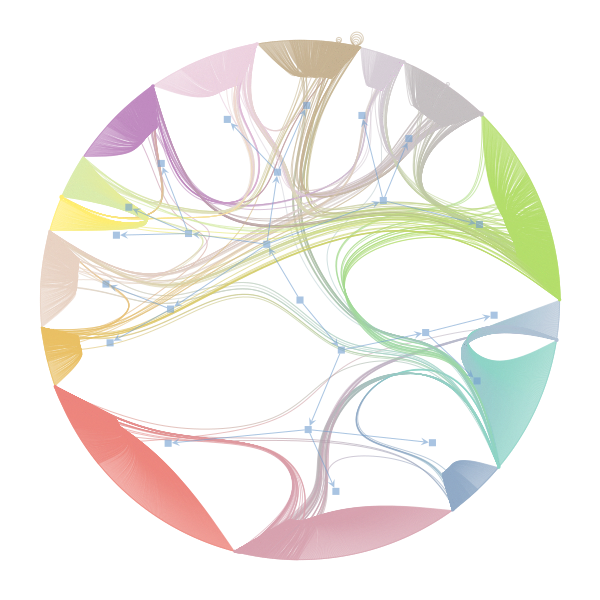

(<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x117410650, at 0x1174a2c10>,
 <Graph object, directed, with 2319 vertices and 2318 edges at 0x116d10e50>,
 <PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x116d10e50, at 0x11653e050>)

In [476]:
minigraph3, vertexdict3 = buildlocalgraph(pmid_vertex_dict[rootpmid], g, 5, 5)
state = gt.minimize_nested_blockmodel_dl(minigraph3, deg_corr=True)
gt.draw_hierarchy(state)

# NEXT: CO-AUTHORSHIP / COLLABORATION NETWORKS (e.g. can click author name on paper and see network info), TAG PREDICTIONS, SEARCH ENGINE (limited to interesting papers with good nearby citation network counts?), "Self cite index" to apply to authors (and "adjusted" H-Index?), by gender self cites?

# How to label graph nodes; make clickable?
labels: http://stackoverflow.com/questions/24221792/graph-tool-draw-graph-with-user-defined-vertex-text

### first labels

In [2]:
def addedge(graphobject, source, dest, vertexdict, v_label):
    if source not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[source] = int(v)
        v_label[v] = str(rev_pmid_vertex_dict[dest])
    if dest not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[dest] = int(v)
        v_label[v] = str(rev_pmid_vertex_dict[dest])
    graphobject.add_edge(vertexdict[source], vertexdict[dest])
    return graphobject, vertexdict, v_label
       
import Queue
import graph_tool.all as gt
                
def buildlocalgraph(rootnode, mastergraph, indepth = 0, outdepth = 2):
    _g =gt.Graph()
    _vertexdict = dict()
    q = Queue.Queue()
    v_label = _g.new_vertex_property("string")
    #first go in out direction
    q.put((rootnode, 0))
    while not q.empty():
        node = q.get()
        if node[1] < outdepth:
            try:
                for neigh in mastergraph.vertex(node[0]).out_neighbours():
                    _g, _vertexdict, v_label = addedge(_g, node[0], neigh, _vertexdict, v_label)
                    q.put((neigh, node[1]+1))
            except KeyError:
                print "{} degree node {} not in graph g".format(node[1], node[0])
    #now go in in direction
    q.put((rootnode, 0))
    while not q.empty():
        node = q.get()
        if node[1] < indepth:
            try:
                for neigh in mastergraph.vertex(node[0]).in_neighbours():
                    _g, _vertexdict, v_label = addedge(_g, neigh, node[0], _vertexdict, v_label)
                    q.put((neigh, node[1]+1))
            except KeyError:
                "{} degree node {} not in graph g".format(node[1], node[0])
    return _g, _vertexdict, v_label

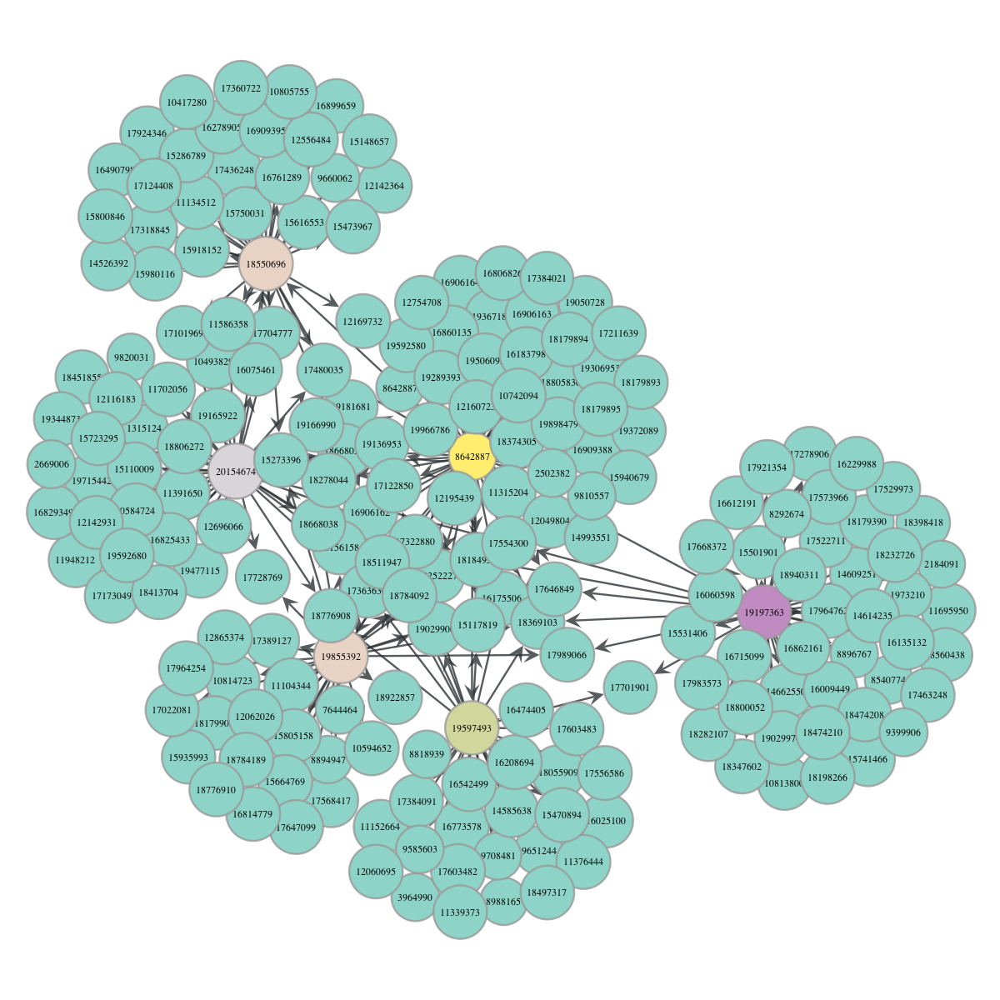

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x116aa7190, at 0x116ada250>

In [542]:
rootpmid = 20502679
#rev_pmid_vertex_dict = {v: k for k, v in pmid_vertex_dict.items()}
minigraph3, vertexdict3, v_label = buildlocalgraph(pmid_vertex_dict[rootpmid], g, 0, 2)
deg = minigraph3.degree_property_map("out") #out AND in how?
gt.graph_draw(minigraph3, vertex_fill_color=deg, vertex_text=v_label, output_size=(1200,1200))

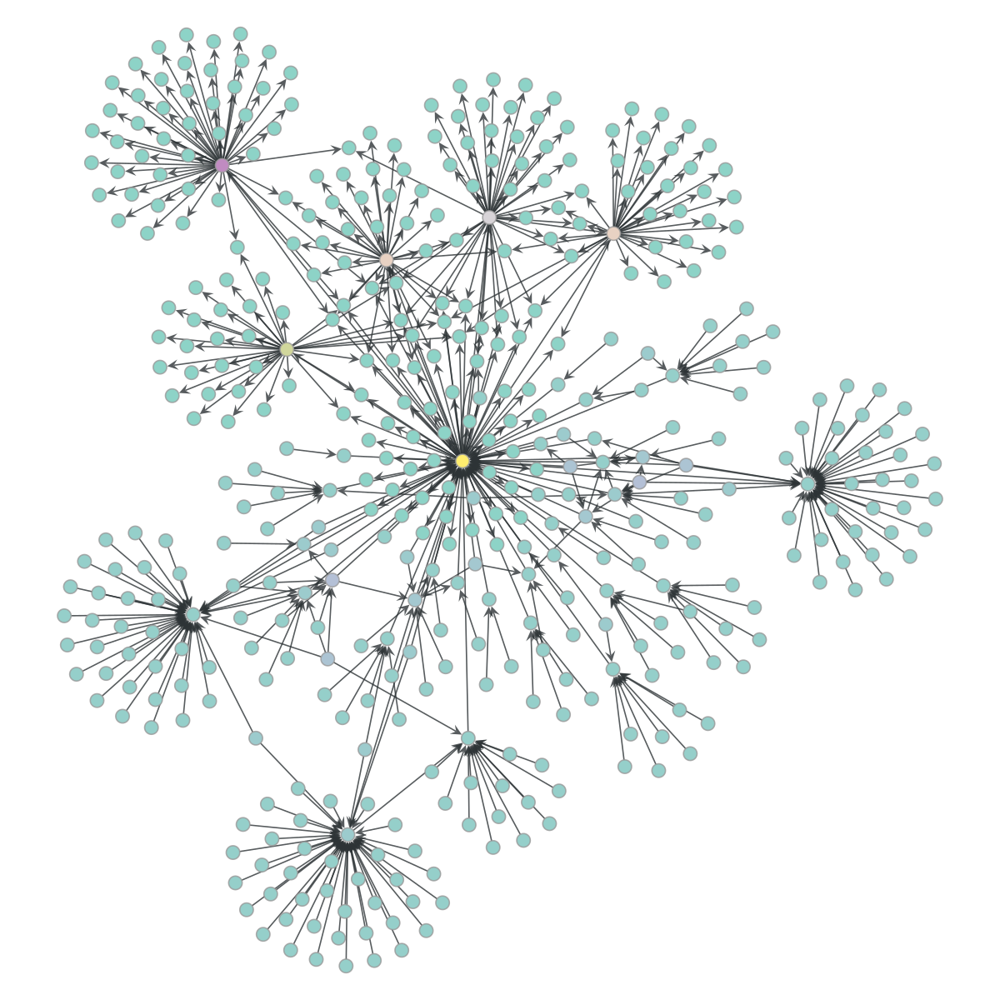

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x116aa7410, at 0x117162b90>

In [544]:
rootpmid = 20502679
#rev_pmid_vertex_dict = {v: k for k, v in pmid_vertex_dict.items()}
minigraph3, vertexdict3, v_label = buildlocalgraph(pmid_vertex_dict[rootpmid], g, 2, 2)
deg = minigraph3.degree_property_map("out") #out AND in how?
gt.graph_draw(minigraph3, vertex_fill_color=deg, output_size=(1200,1200))

# Co-author networks

See: http://www-personal.umich.edu/~mejn/papers/cnlspre.pdf
Initially, what I want to do is 

In [1]:
import sqlite3
conn = sqlite3.connect('pmcv1-full.db')
c = conn.cursor()

In [2]:
rootpmid = 20502679
c.execute('''SELECT pmid, fn, ln FROM authors WHERE pmid > ? AND pmid < ?''', [rootpmid-100, rootpmid+100])
authors = c.fetchall()
print len(authors)

595


In [11]:
#fullnames:
authors[i][1]+authors[i][2]

u'NaihaoYe'

In [3]:
#import graph_tool.all as gt
import graph_tool as gt

In [5]:
import hashlib
def md5hash(string):
    return hashlib.md5(string).hexdigest()

def addedge(graphobject, source, dest, vertexdict):
    if source not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[source] = int(v)
    if dest not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[dest] = int(v)
    graphobject.add_edge(vertexdict[source], vertexdict[dest])
    return graphobject, vertexdict

In [6]:
import itertools
g = gt.Graph(directed = False)
author_vertex_dict = dict()
author_full_name_dict = dict()
c.execute('''SELECT pmid, fn, ln FROM authors WHERE pmid > ? AND pmid < ?''', [rootpmid-100, rootpmid+100])
authors = c.fetchall()
authorspaper = []
currpaper = authors[0][0]
for entry in authors:
    #accumulate by paper
    authorcat = unicode(entry[1]+entry[2]).replace(" ", "").lower()
    authorspaper.append(authorcat)
    author_full_name_dict[authorcat] = (entry[1],entry[2])
    if entry[0] != currpaper:
        #add author nodes and edges
        for comb in itertools.combinations(authorspaper, 2):
            addedge(g, comb[0], comb[1], author_vertex_dict)
        #reset and begin accumulating again
        currpaper = entry[0]
        authorspaper = []

In [7]:
g

<Graph object, undirected, with 588 vertices and 2863 edges at 0x113a4ad90>

In [56]:
author_vertex_dict["serenafondaumani"]

490

In [60]:
author_full_name_dict["serenafondaumani"]

(u'Serena', u'Fonda Umani')

In [ ]:
#%matplotlib inline
#gt.graph_draw(g, output_size=(1200,1200), output_format="png")

### build full graph

In [12]:
#THIS CALCULATION IS SLOW!!!! Like 5 hours slow. SVE THE DICTS AND THE GRAPH WHEN DONE

In [1]:
import cPickle as pickle
g = pickle.load(open("authors_full_graph.p", "rb"))
author_vertex_dict = pickle.load(open("authors_vertex_dict.p", "rb"))
author_full_name_dict = pickle.load(open("authors_full_name_dict.p", "rb"))

** in future may want to give edges weights, where appearing on one paper together = 1, 2 = 2, and so on. **

In [2]:
def addedge(graphobject, source, dest, vertexdict):
    if source not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[source] = int(v)
    if dest not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[dest] = int(v)
    graphobject.add_edge(vertexdict[source], vertexdict[dest])
    return graphobject, vertexdict

import Queue
import graph_tool.all as gt
def buildlocalgraph(rootnode, mastergraph, indepth = 0, outdepth = 2):
    _g =gt.Graph()
    _vertexdict = dict()
    q = Queue.Queue()
    q.put((rootnode, 0))
    #first go in out direction
    while not q.empty():
        node = q.get()
        if node[1] <= outdepth:
            try:
                for neigh in _g.vertex(node[0]).out_neighbors():
                    _g, _vertexdict = addedge(_g, node[0], neigh, _vertexdict)
            except KeyError:
                "{} degree node {} not in graph g".format(node[1], node[0])
                
def buildlocalgraphundirected(rootnode, mastergraph, indepth = 0, outdepth = 2):
    _g =gt.Graph(directed = False)
    _vertexdict = dict()
    q = Queue.Queue()
    #first go in out direction
    q.put((rootnode, 0))
    while not q.empty():
        node = q.get()
        if node[1] < outdepth:
            try:
                for neigh in mastergraph.vertex(node[0]).out_neighbours():
                    _g, _vertexdict = addedge(_g, node[0], neigh, _vertexdict)
                    q.put((neigh, node[1]+1))
            except KeyError:
                "{} degree node {} not in graph g".format(node[1], node[0])
    #now go in in direction
    q.put((rootnode, 0))
    while not q.empty():
        node = q.get()
        if node[1] < indepth:
            try:
                for neigh in mastergraph.vertex(node[0]).in_neighbours():
                    _g, _vertexdict = addedge(_g, neigh, node[0], _vertexdict)
                    q.put((neigh, node[1]+1))
            except KeyError:
                "{} degree node {} not in graph g".format(node[1], node[0])
    return _g, _vertexdict

In [33]:
#plots
#%matplotlib inline
#import matplotlib.pyplot as plt
#import numpy as np

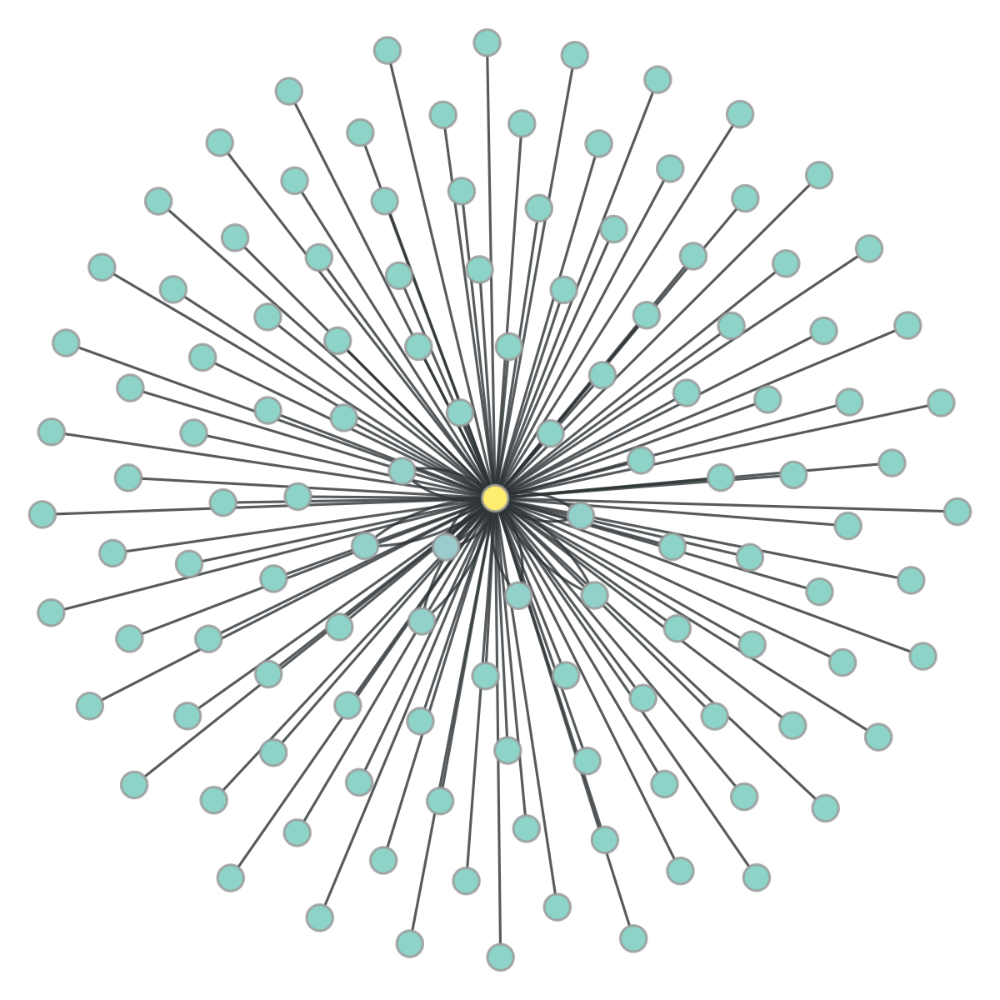

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x192adab90, at 0x1713e1e90>

In [3]:
#author = u'martinjshipley'
author = u'emmanuellebouzigon'
minigraph3, vertexdict3 = buildlocalgraphundirected(author_vertex_dict[author], g, 1, 1)
deg = minigraph3.degree_property_map("out") #out AND in how?
gt.graph_draw(minigraph3, vertex_fill_color=deg, output_size=(1200,1200), inline=True)

In [16]:
author_vertex_dict

{u'danutako\u0142o\u017cyn-krajewska': 245480,
 u'wen-tingchu': 2221970,
 u'deepakprakashmahara': 485554,
 u'sarahmweakley': 1222212,
 u'kristinap.vatcheva': 1576754,
 u'jeanpascalherault': 970387,
 u'tuulavaskilampi': 460076,
 u'charlesd.warden': 1721371,
 u'alirezaabdulahzadebaghaee': 1498307,
 u'ashishpathak': 196499,
 u'chih-jaantai': 250113,
 u'stephaniedifrancesco': 313533,
 u'kennethfmanly': 1193570,
 u'carlenayuen': 1022453,
 u'georgezafiriou': 514825,
 u'dennisc.sgroi': 632897,
 u'cristinawisnivesky-colli': 2357595,
 u'kaiyuezhang': 551389,
 u'josephe.leclerc': 2046040,
 u'm.warner': 237154,
 u'carolinavillagra': 2181410,
 u'nancybaker': 1870875,
 u'tomoshigematsumoto': 509066,
 u'doughinerfeld': 1844157,
 u'candanzehraduvan': 1501797,
 u'esinsoy': 1509351,
 u'jonseo': 1666058,
 u'wilfriedmullens': 212634,
 u'evaperez-jimenez': 1689799,
 u'magdalenawadowska': 1613876,
 u'augustosimoes-barbosa': 1704858,
 u'n.s.bisht': 298384,
 u'razanwafai': 579042,
 u'douglasa.marchuk': 81481

In [17]:
author = u'martinjshipley'

# build full collaboration graph WITH weighted edges for number of times collaborated
** IN PROGRESS ON LAPTOP AS OF 11PM 6-27-16 **

** CANCELED at 7am - but started on vagrant ipython notebook session**

In [1]:
import graph_tool as gt

In [2]:
def addweightededge(graphobject, source, dest, vertexdict, weight):
    if source not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[source] = int(v)
    if dest not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[dest] = int(v)
    if graphobject.edge(vertexdict[source], vertexdict[dest]) == None:
        e = graphobject.add_edge(vertexdict[source], vertexdict[dest])
        weight[e] = 1
    else:
        weight[graphobject.edge(vertexdict[source], vertexdict[dest])] += 1
    return graphobject, vertexdict

In [1]:
import sqlite3
conn = sqlite3.connect('pmcv1-full.db')
c = conn.cursor()

In [ ]:
import itertools
g = gt.Graph(directed = False)
edge_weight = g.new_edge_property("int32_t")
author_vertex_dict = dict()
author_full_name_dict = dict()
c.execute('''SELECT pmid, fn, ln FROM authors''')
authors = c.fetchall()
authorspaper = []
currpaper = authors[0][0]
cnt = 0
for entry in authors:
    #accumulate by paper
    authorcat = unicode(entry[1]+entry[2]).replace(" ", "").lower()
    authorspaper.append(authorcat)
    author_full_name_dict[authorcat] = (entry[1],entry[2])
    if entry[0] != currpaper:
        #add author nodes and edges
        for comb in itertools.combinations(authorspaper, 2):
            addweightededge(g, comb[0], comb[1], author_vertex_dict, edge_weight)
        #reset and begin accumulating again
        currpaper = entry[0]
        authorspaper = []
    cnt += 1
    if cnt % 50000 == 0: print cnt #total 5,745,410 lines of authors in db
        


In [ ]:
import cPickle as pickle
pickle.dump(g, open("authors_full_graph_with_weights.p", "wb"))
pickle.dump(author_vertex_dict, open("authors_vertex_dict_weights.p", "wb"))
pickle.dump(author_full_name_dict, open("authors_full_name_dict_weights.p", "wb"))
pickle.dump(edge_weight, open("authors_full_graph_weights.p", "wb"))

** once this is done on DO **
https://graph-tool.skewed.de/static/doc/flow.html#graph_tool.flow.min_cut

** for not working without weights **

In [1]:
import cPickle as pickle
g = pickle.load(open("authors_full_graph.p", "rb"))
author_vertex_dict = pickle.load(open("authors_vertex_dict.p", "rb"))
author_full_name_dict = pickle.load(open("authors_full_name_dict.p", "rb"))

In [30]:
rev_author_vertex_dict = {v: k for k, v in author_vertex_dict.items()}

In [2]:
# shortest path
# https://graph-tool.skewed.de/static/doc/topology.html?highlight=shortest%20path#graph_tool.topology.shortest_path

In [3]:
author_full_name_dict

{u'danutako\u0142o\u017cyn-krajewska': (u'Danuta',
  u'Ko\u0142o\u017cyn-Krajewska'),
 u'gongbifu': (u'GONGBI', u'FU'),
 u'deepakprakashmahara': (u'Deepak Prakash', u'Mahara'),
 u'sarahmweakley': (u'Sarah M', u'Weakley'),
 u'kristinap.vatcheva': (u'Kristina P.', u'Vatcheva'),
 u'jeanpascalherault': (u'Jean Pascal', u'Herault'),
 u'tuulavaskilampi': (u'Tuula', u'Vaskilampi'),
 u'charlesd.warden': (u'Charles D.', u'Warden'),
 u'ashishpathak': (u'Ashish', u'Pathak'),
 u'chih-jaantai': (u'Chih-Jaan', u'Tai'),
 u'stephaniedifrancesco': (u'Stephanie', u'Difrancesco'),
 u'kennethfmanly': (u'Kenneth F', u'Manly'),
 u'carlenayuen': (u'Carlen A', u'Yuen'),
 u'georgezafiriou': (u'George', u'Zafiriou'),
 u'dennisc.sgroi': (u'Dennis C.', u'Sgroi'),
 u'maxjlchen': (u'Max JL', u'Chen'),
 u'cristinawisnivesky-colli': (u'Cristina', u'Wisnivesky-Colli'),
 u'kaiyuezhang': (u'Kaiyue', u'Zhang'),
 u'josephe.leclerc': (u'Joseph E.', u'LeClerc'),
 u'sokratispastromas': (u'Sokratis', u'Pastromas'),
 u'carolin

In [7]:
author_vertex_dict[u'kennethfmanly']
author_vertex_dict[u'nancybaker']

1870875

In [71]:
import graph_tool.topology as topology

In [73]:
vlist, elist = topology.shortest_path(g, g.vertex(author_vertex_dict[u'kennethfmanly']),
                                      g.vertex(author_vertex_dict[u'zhihuitong']))

In [ ]:
#topology.absolute_import

In [72]:
#topology.all_shortest_paths(g, g.vertex(author_vertex_dict[u'kennethfmanly']),
                                      g.vertex(author_vertex_dict[u'zhihuitong']))

AttributeError: 'module' object has no attribute 'all_shortest_paths'

In [36]:
for edge in elist: 
    test= edge

In [46]:
int(test.target())

327

In [91]:
def addedge(graphobject, source, dest, vertexdict, v_label):
    if source not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[source] = int(v)
        v_label[v] = str(rev_pmid_vertex_dict[dest])
    if dest not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[dest] = int(v)
        v_label[v] = str(rev_pmid_vertex_dict[dest])
    graphobject.add_edge(vertexdict[source], vertexdict[dest])
    return graphobject, vertexdict, v_label
       
import graph_tool as gt
                
def buildauthorgraph(nodelist, edgelist, authordict, mastergraph):
    _g =gt.Graph(directed = False)
    _vertexdict = dict()
    v_label = _g.new_vertex_property("string")
    #first add nodes
    for node in nodelist:
        v = _g.add_vertex()
        _vertexdict[node] = int(v)
        v_label[v] = str(author_full_name_dict[authordict[node]]).strip('()').strip("'").replace("u'", "").replace("',", "")
    #now add edges
    for edge in edgelist:
        _g.add_edge(_vertexdict[int(edge.source())], _vertexdict[int(edge.target())])
    return _g, _vertexdict, v_label

In [92]:
authg, authdict, authlab = buildauthorgraph(vlist, elist, rev_author_vertex_dict, g)

In [90]:
str(author_full_name_dict[rev_author_vertex_dict[11]]).strip('()').strip("'").replace("u'", "").replace("',", "")

'Shinichi Miyake'

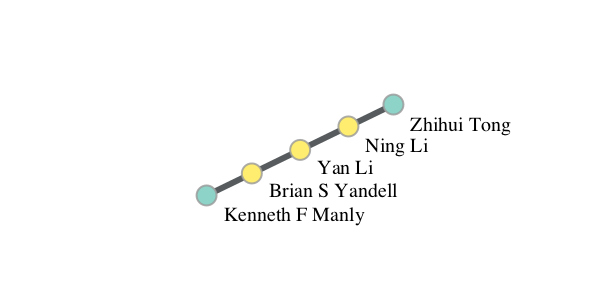

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x16e99be10, at 0x10c2789d0>

In [145]:
#see formatting at https://graph-tool.skewed.de/static/doc/draw.html
import graph_tool.all as gt
deg = authg.degree_property_map("out") #out AND in how?
gt.graph_draw(authg, vertex_fill_color=deg, vertex_text=authlab, output_size=(600,300), 
              vertex_text_position=3.14/4., vertex_size = 20, vertex_font_size = 20,
              edge_pen_width = 6, inline=True)

In [146]:
#all_shortest_paths not working on ubuntu either - may need debian
#http://main-discussion-list-for-the-graph-tool-project.982480.n3.nabble.com/Debian-package-and-boost-at-compile-time-td4026383i20.html
#https://graph-tool.skewed.de/static/doc/search_module.html#graph_tool.search.dijkstra_search

### OK, let's make collaboration network graph

As seen:
http://stackoverflow.com/questions/238724/visualizing-undirected-graph-thats-too-large-for-graphviz
fig 7:http://www-personal.umich.edu/~mejn/papers/cnlspre.pdf

In [1]:
import cPickle as pickle
import graph_tool.all as gt
g = gt.load_graph("authors_full_graph.gt")
author_vertex_dict = pickle.load(open("authors_vertex_dict.p", "rb"))
author_full_name_dict = pickle.load(open("authors_full_name_dict.p", "rb"))

In [2]:
rev_author_vertex_dict = {v: k for k, v in author_vertex_dict.items()}

In [3]:
import Queue
import graph_tool.all as gt

def authoraddedge(graphobject, source, dest, vertexdict, v_label):
    if source not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[source] = int(v)
        v_label[v] = str(author_full_name_dict[rev_author_vertex_dict[source]]).strip('()').strip("'").replace("u'", "").replace("',", "")
    if dest not in vertexdict:
        v = graphobject.add_vertex()
        vertexdict[dest] = int(v) 
        #author_full_name_dict[rev_author_vertex_dict[150083]]
        v_label[v] = str(author_full_name_dict[rev_author_vertex_dict[dest]]).strip('()').strip("'").replace("u'", "").replace("',", "")
    graphobject.add_edge(vertexdict[source], vertexdict[dest])
    return graphobject, vertexdict, v_label

def buildlocalgraphundirectedauthor(rootnode, mastergraph, depth = 1):
    _g =gt.Graph(directed = False)
    _v_label = _g.new_vertex_property("string")
    _vertexdict = dict()
    q = Queue.Queue()
    #undirected, only one direction
    q.put((rootnode, 0))
    while not q.empty():
        node = q.get()
        if node[1] < depth:
            try:
                for neigh in mastergraph.vertex(node[0]).all_neighbours():
                    _g, _vertexdict, _v_label = authoraddedge(_g, node[0], neigh, _vertexdict, _v_label)
                    q.put((neigh, node[1]+1))
            except KeyError:
                "{} degree node {} not in graph g".format(node[1], node[0])
    return _g, _vertexdict, _v_label

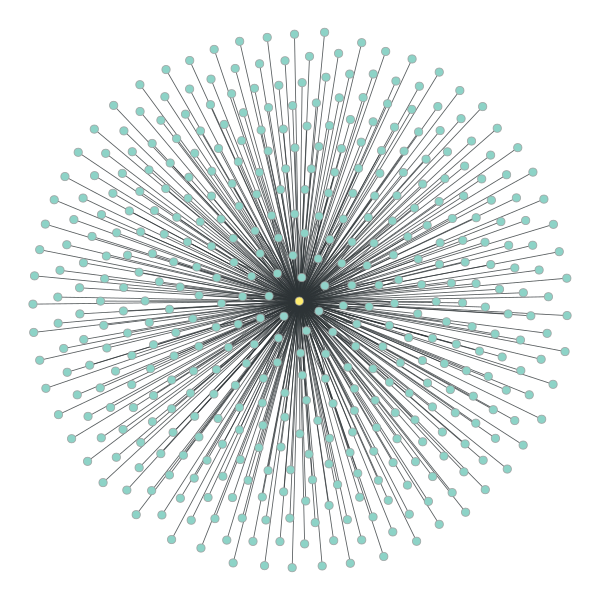

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x36675d910, at 0x370d48650>

In [5]:
author1 = u"Di Wang"
author1 = author1.replace(" ","").lower()
authorgraph, authorvertexdict, v_label = buildlocalgraphundirectedauthor(author_vertex_dict[author1], g, 1)
deg = authorgraph.degree_property_map("out") #out AND in how?
gt.graph_draw(authorgraph, vertex_fill_color=deg, output_size=(600,600), inline=True)

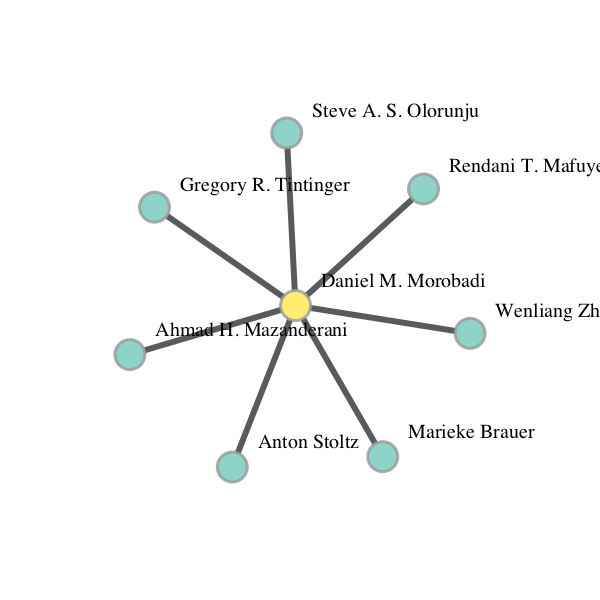

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x366946210, at 0x36675da90>

In [6]:
#can be done to two degrees deep IF the first ring of collabs is small. 
#could program it to only do 2 degrees if the out connections for the name node are under some small number,
#e.g. 10, if greater, it only does 1 degree
author1 = u"danielm.morobadi"
author1 = author1.replace(" ","").lower()
authorgraph, authorvertexdict, v_label = buildlocalgraphundirectedauthor(author_vertex_dict[author1], g, 1)
deg = authorgraph.degree_property_map("out") #out AND in how?
gt.graph_draw(authorgraph, vertex_fill_color=deg, output_size=(600,600), inline=True, vertex_text=v_label,
             vertex_text_position=3.14*2-3.14/4, vertex_size = 30, vertex_font_size = 20, edge_pen_width = 6)

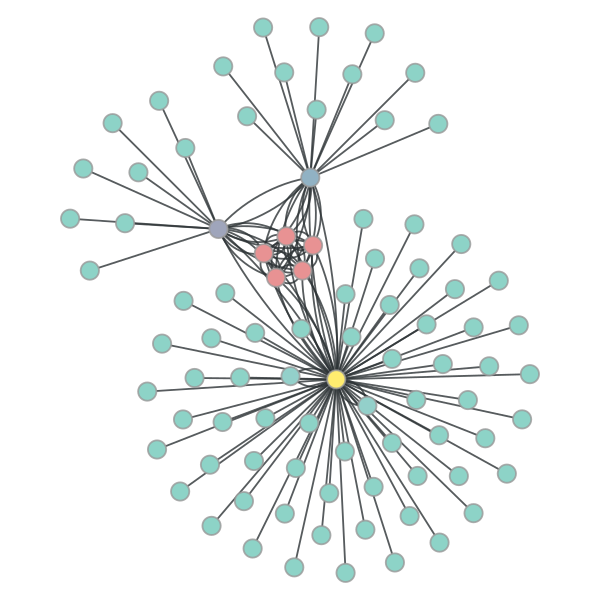

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x366779510, at 0x38eff3e50>

In [7]:
author1 = u"danielm.morobadi"
author1 = author1.replace(" ","").lower()
authorgraph, authorvertexdict, v_label = buildlocalgraphundirectedauthor(author_vertex_dict[author1], g, 2)
deg = authorgraph.degree_property_map("out") #out AND in how?
gt.graph_draw(authorgraph, vertex_fill_color=deg, output_size=(600,600), inline=True)

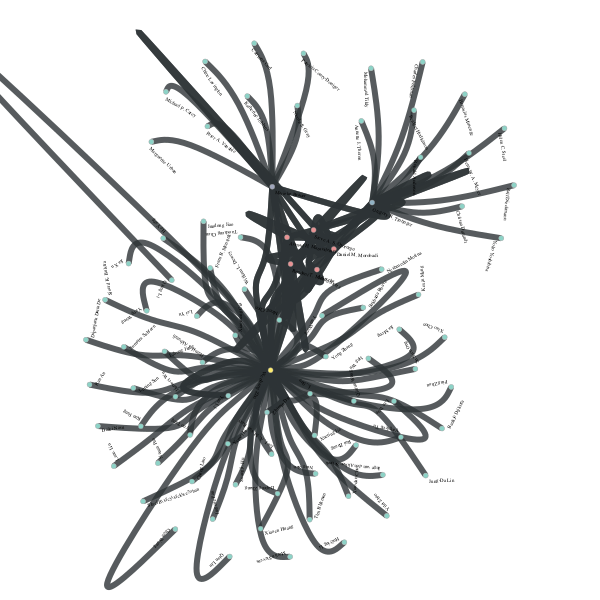

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x366948910, at 0x36675dd10>

In [8]:
author1 = u"danielm.morobadi"
author1 = author1.replace(" ","").lower()
authorgraph, authorvertexdict, v_label = buildlocalgraphundirectedauthor(author_vertex_dict[author1], g, 2)
deg = authorgraph.degree_property_map("out") #out AND in how?

state = gt.minimize_nested_blockmodel_dl(authorgraph, deg_corr=True)
bstack = state.get_bstack()
#t = gt.get_hierarchy_tree(bstack)[0]
t = gt.get_hierarchy_tree(state)[0]
tpos = pos = gt.radial_tree_layout(t, t.vertex(t.num_vertices() - 1), weighted=True)#
cts = gt.get_hierarchy_control_points(authorgraph, t, tpos)#crashing here? ##BECAUSE OF G!!!
pos = authorgraph.own_property(tpos)
b = bstack[0].vp["b"]

#labels
import math
text_rot = authorgraph.new_vertex_property('double')
authorgraph.vertex_properties['text_rot'] = text_rot
for v in authorgraph.vertices():
    if pos[v][0] >0:
        text_rot[v] = math.atan(pos[v][1]/pos[v][0])
    else:
        text_rot[v] = math.pi + math.atan(pos[v][1]/pos[v][0])

gt.graph_draw(authorgraph, vertex_fill_color=deg, output_size=(600,600), inline=True, vertex_text=v_label,
             vertex_text_position=1, vertex_size = 5, vertex_font_size = 5, edge_pen_width = 6,
             vertex_text_rotation=text_rot, vertex_anchor=0, edge_control_points=cts)

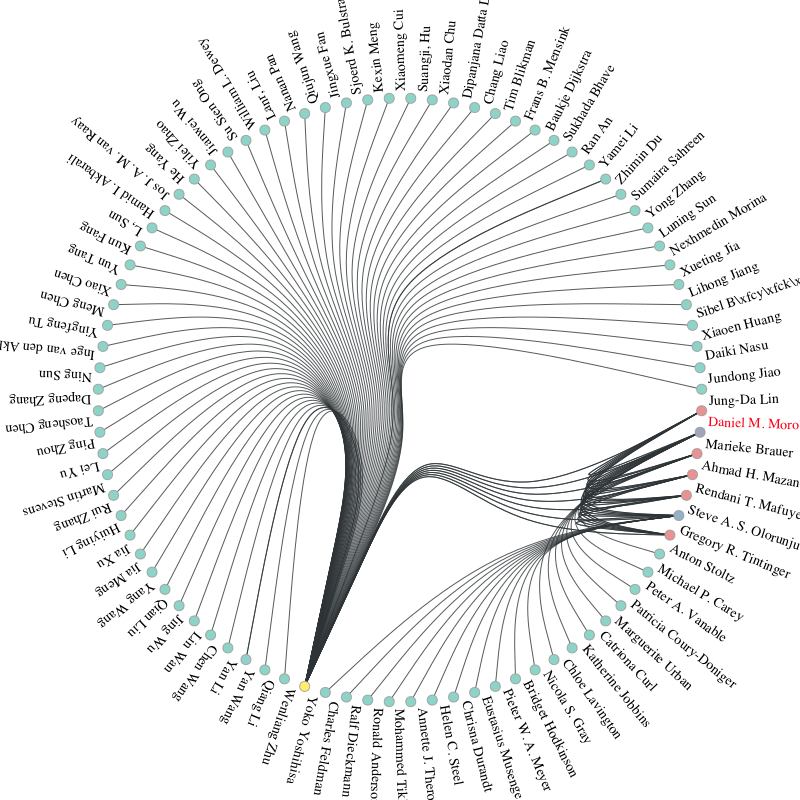

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x366972d90, at 0x1046f5610>

In [9]:
author = u"Daniel M. Morobadi"
author = author.replace(" ","").lower()
authorgraph, authorvertexdict, v_label = buildlocalgraphundirectedauthor(author_vertex_dict[author], g, 2)
deg = authorgraph.degree_property_map("total") #out AND in how? #TOTAL!

state = gt.minimize_nested_blockmodel_dl(authorgraph, deg_corr=True)
bstack = state.get_bstack()
#t = gt.get_hierarchy_tree(bstack)[0]
t = gt.get_hierarchy_tree(state)[0]
tpos = pos = gt.radial_tree_layout(t, t.vertex(t.num_vertices() - 1), weighted=True)#
cts = gt.get_hierarchy_control_points(authorgraph, t, tpos)#crashing here? ##BECAUSE OF G!!!
pos = authorgraph.own_property(tpos)
b = bstack[0].vp["b"]

#labels
import math
text_rot = authorgraph.new_vertex_property('double')
authorgraph.vertex_properties['text_rot'] = text_rot
for v in authorgraph.vertices():
    if pos[v][0] >0:
        text_rot[v] = math.atan(pos[v][1]/pos[v][0])
    else:
        text_rot[v] = math.pi + math.atan(pos[v][1]/pos[v][0])
        
#text color
text_col = authorgraph.new_vertex_property("vector<double>")
for i, v in enumerate(authorgraph.vertices()):
    if i == 0:
        text_col[v] = [1,0,.1,1]
    else:
        text_col[v] = [0,0,0,1]

gt.graph_draw(authorgraph, pos=pos, 
            edge_control_points=cts,
            vertex_size=10,
            vertex_text=v_label,
            #vertex_text_rotation=authorgraph.vertex_properties['text_rot'],
            vertex_text_rotation=text_rot,  
            vertex_text_position=1,
            vertex_font_size=14,
            vertex_anchor=0,
            vertex_fill_color=deg,
            vertex_text_color=text_col,
            #vertex_text_color=[.5,0,.1,1],
            #bg_color=[0,0,0,1],
            output_size=[800,800],
            inline = True)